# <i>COM-418 - Computers and Music</i> <br /> <br />  <b>Nonlinear modelling</b> 

<div align="right"><a href="https://people.epfl.ch/lucie.perrotta">Lucie Perrotta</a> and <a href="https://people.epfl.ch/paolo.prandoni">Paolo Prandoni</a>, <a href="https://www.epfl.ch/labs/lcav/">LCAV, EPFL</a></div>

In [48]:
%matplotlib inline
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from IPython.display import Audio

import import_ipynb
from Helpers import *

import warnings
warnings.filterwarnings('ignore') # Ignore warnings

matplotlib.rcParams.update({'font.size': 16})
figsize=(10,5)
fs=44100

In this notebook, we will review and implement a couple techniques for modelling nonlinear effects in music. Nonlinearities are omnipresent in music, like in amplifiers, distortions, and such. 

## 1. Static waveshaper

The simplest way to implement a nonlinearity digitally is to define a non-linear function in $[-1, 1] \rightarrow [-1, 1]$ and to apply it piece-wise to all samples of a signal. This method is called the **static waveshaper**, it does not depend on time and has no memory. 

The simplest way of creating a non-linearity in a digital environment is to use the effect called **clipping**. Clipping occurs when a signal exceeds the bounds of the support it is in. In our case, all our audio signals have always been bounded between $-1$ and $+1$, with $-1$ corresponding to the most retracted position the speaker can take when producing a sound, and $+1$ being the most pushed out position it can take. Any value beyond this range cannot be reproduced by the loudspeaker, and will be naturally (or in our case, numerically) pushed back to the closest boundary. This crushing of the exceeding data to $+1$ or $-1$ is clipping. Acoustically, it sounds like a distorted, agressive version of the signal.

### 1.1. Hard-clipping distortion

There are principally 2 types of clipping: **hard-clipping**, and **soft-clipping**. Hard-clipping consists in simply replacing any sample outside the $[-1,1]$ range to either $-1$ or $+1$. To manually create a hard-clipping distortion, we simply amplify the signal with a constant factor $\alpha$, and clip all the excess data back into the range. 

$$
f_\alpha(x) = \begin{cases}
-1, &\text{if } x \leq -1/\alpha \\
\alpha  x, &\text{if } -1/\alpha \leq x \leq 1/\alpha \\
+1, &\text{if } x \geq 1/\alpha
\end{cases}
$$

Let's implement it!

In [2]:
def hardClipping(x, alpha):
    """
    Hard clipping distortion, amplifies and cuts the signal that exceeds the [-1,1] range.
    x: the input signal
    alpha: the intensity of the amplification
    return: the hard-clipped signal
    """
    out = x * alpha # Increase the slope in the middle
    out = np.where(out>=1, 1, out) # Upper clipping
    return np.where(out<=-1, -1, out) # Lower clipping

We can now observe what the waveshaper looks like for different values of $\alpha$.

In [3]:
@widgets.interact(alpha=(1, 20, 1))
def update(alpha=3):
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot( np.linspace(-1, 1, 1000), hardClipping(np.linspace(-1, 1, 1000), alpha) )
    plt.title("Hard-clipping distortion waveshaper")
    plt.xlabel("Input")
    plt.ylabel("Output")
    ax.set_xlim([-1, 1])
    ax.set_ylim([-1.1, 1.1])
    ax.grid(True)
    plt.show()

interactive(children=(IntSlider(value=3, description='alpha', max=20, min=1), Output()), _dom_classes=('widget…

Observe the sharp angles of the waveshaper when it it the bounaries. This is the main reason for the sound being distorted after such a transformation. Let's try to listen to what is sounds on a guitar sample.

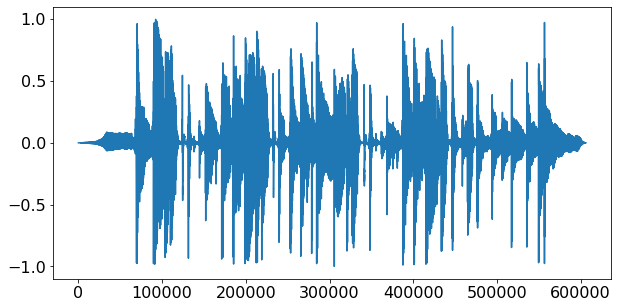

In [4]:
guitar_sample = open_audio('samples/guitar.wav')
Audio("samples/guitar.wav", autoplay=False)

Okay, now let's apply it.

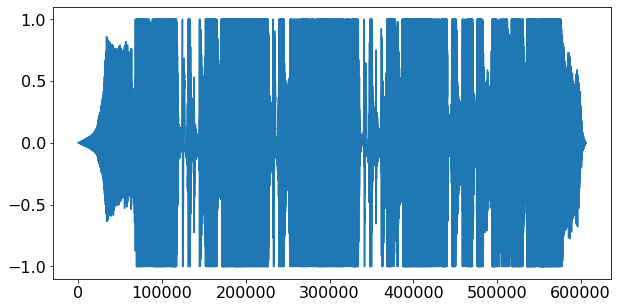

In [5]:
guitar_hardclip = hardClipping(guitar_sample, 10)

plt.figure(figsize=figsize)
plt.plot(guitar_hardclip)

Audio(guitar_hardclip, rate=fs)

The sound is super harsh, principally because of the hard edges we talked about above. Although this kind of guitar sound may be interesting for composing *extreme metal* music, we may need a little more workaround in order to get some more controlled amplifier and distortion sounds.

### 1.2. Infinite-clipping distortion

A special case of hard-clipping distortion is the so called *infinite clipping* distortion, where all the samples are pushed to the closest value in the set $\{-1, 1\}$. This function hence resembles the $sign$ function, although differs from it by the fact that the input $0$ is going to be mapped to $1$, unlike the $sign$ function where the output of $0$ stays $0$.

$$
f(x) = \begin{cases}
-1, &\text{if } x < 0 \\
+1, &\text{if } x \geq 0
\end{cases}
$$

In [6]:
def infiniteClipping(x):
    """
    Infinite clipping distortion, pushes the signal to its maximum amplitude (positive or negative).
    x: input signal
    return: a signal of -1s and 1s only
    """
    return np.where(x >= 0, 1., -1.) # Input 0 is sent to +1

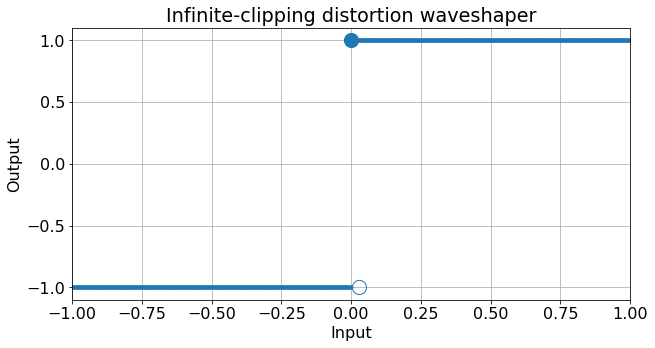

In [7]:
fig, ax = plt.subplots(figsize=figsize)

ax.plot( np.linspace(-1, 1, 1000), infiniteClipping(np.linspace(-1, 1, 1000)), ".", color="C0")
ax.scatter(0, 1, s=200, facecolors='C0', edgecolors='C0', zorder=3) 
ax.scatter(0.03,-1, s=200, facecolors='none', edgecolors='C0', zorder=3) 

plt.title("Infinite-clipping distortion waveshaper")
plt.xlabel("Input")
plt.ylabel("Output")
ax.set_xlim([-1, 1])
ax.set_ylim([-1.1, 1.1])
ax.grid(True)
plt.show()

As one can expect, this result in an extremely harsh sound, and is not very interesting acoustically speaking. The main interest of infinite clipping is more about data compression, since we now only need 1 bit to store each sample, instead of 16 or 32 for standard music! Let's still give it a try, for the sake of engineering...

**Warning, this is very loud, turn your volume down before playing!**

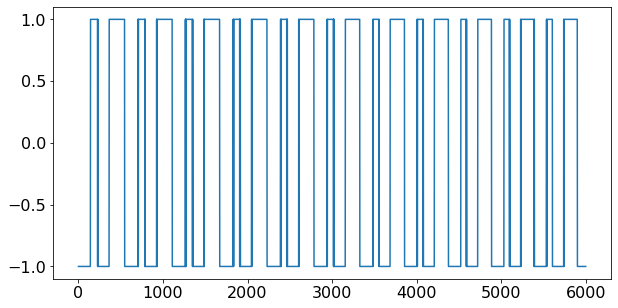

In [8]:
guitar_infclip = infiniteClipping(guitar_sample)

plt.figure(figsize=figsize)
plt.plot(guitar_infclip[10000:16000])

Audio(guitar_infclip, rate=fs)

### 1.3. Soft-clipping distortion

To fix the *hard edge* problem of the hard-clipping waveshaper, we can use a smooth, continuous function in $[-1, 1]$ that ressembles the hard-clipping function (typically a function looking like an "S"). There are many such functions, and a lot have been used in different implementations of digital amplifiers and distortions over time. In this notebook, we use a popular one defined as follows:

\begin{align*}
    f_\alpha(x) = \frac{ \arctan ( \alpha \cdot x ) }{\arctan ( \alpha ) } .
\end{align*}

While increasing the power of the low amplitudes, it reduces the range of the high amplitudes. It can be tuned by a parameter $\alpha$ that controls the intensity of the distortion: the higher $\alpha$ the harder the clipping.

In [9]:
def softClipping(x, alpha=10):
    """
    Soft-clipping distortion. One can choose among 3 non-linear functions by uncommenting one line.
    x: input signal
    a: order (intensity) of the non-linearity
    return: the filtered signal
    """
    # return (3*x/2 * (1- x**2 /3)) # Distorsion proposed by Araya(1996)
    # return ((np.abs(2*x) - x**2) * np.sign(x))**alpha # Distorsion proposed by Diodic(1998)
    return np.arctan(alpha*x) / np.arctan(alpha) # Hard clipping distortion

One can observe the effect of $\alpha$ on the distortion function by moving the slider.

In [10]:
@widgets.interact(alpha=(1, 20, 1))
def update(alpha=5):
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot( np.linspace(-1, 1, 100), softClipping(np.linspace(-1, 1, 100), alpha) )
    plt.title("Soft-clipping distortion waveshaper")
    plt.xlabel("Input")
    plt.ylabel("Output")
    ax.set_xlim([-1, 1])
    ax.set_ylim([-1, 1])
    ax.grid(True)
    plt.show()

interactive(children=(IntSlider(value=5, description='alpha', max=20, min=1), Output()), _dom_classes=('widget…

Let's try it on the guitar sample too!

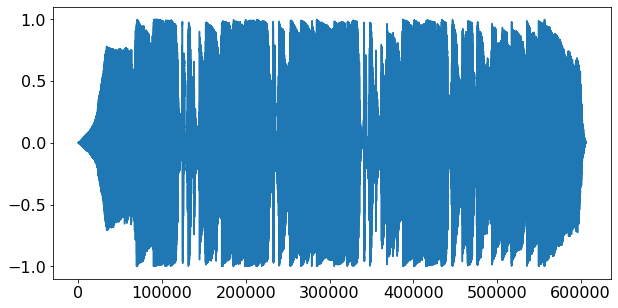

In [11]:
guitar_softclip = softClipping(guitar_sample, 30)

plt.figure(figsize=figsize)
plt.plot(guitar_softclip)

Audio(guitar_softclip, rate=fs)

The sound is now a little crunchier, but is still far from sounding like a nice rock guitar. It also features a problem, aliasing, that we need to fix before we can move to more complex nonlinear models. As a sumup, let's quckly review the effect of the different clippings on a sweep signal.

In [12]:
@widgets.interact(alpha=(1, 20, .1))
def update(alpha=2):

    sine = np.sin(2 * np.pi * np.logspace(-.5, .7, 44100) * np.linspace(0, 1, 44100)) 
    hard = hardClipping(sine, alpha) 
    soft = softClipping(sine, alpha)
    
    linewidth=1.5
    cmap = plt.get_cmap("tab10")
    fig, ax = plt.subplots(3, figsize=(13,13))
    ax[0].plot(sine, linewidth=linewidth, label="Input signal")
    ax[0].plot(hard / alpha, linestyle="--", linewidth=linewidth, alpha=1, label="Hard clip")
    ax[0].plot(soft / alpha, linestyle="--", linewidth=linewidth, alpha=1, label="Soft clip")
    ax[1].plot(hard / np.max(np.abs(hard)), linewidth=linewidth, color=cmap(1))
    ax[2].plot(soft / np.max(np.abs(soft)), linewidth=linewidth, color=cmap(2))
    
    ax[0].axhspan(-1/alpha, 1/alpha, alpha=.1, color="grey", label="Dynamic range")
    ax[0].set_ylim(-1.1,1.1)

    ax[0].set_ylabel("Dry signal")
    ax[1].set_ylabel("Normalized hard clipping")
    ax[2].set_ylabel("Normalized soft clipping")
    
    ax[0].get_xaxis().set_visible(False)
    ax[1].get_xaxis().set_visible(False)
    ax[2].get_xaxis().set_visible(False)
    
    ax[0].legend(loc='best')

    #plt.savefig("clipping.pdf",bbox_inches='tight')
    plt.show()

interactive(children=(FloatSlider(value=2.0, description='alpha', max=20.0, min=1.0), Output()), _dom_classes=…

## 2. Aliasing

One thing to be careful with when using waveshapers (and in many other situations too!) is aliasing. Aliasing occurs when frequencies above the Nyquist frequency are sampled and become "mirrored" on the frequency axis with respect to the Nyquist frequency. They become audible and add unwanted noise to the signal. Nonlinearly reshaping a signal does add harmonics that can often exceed the Nyquist frequency. 

### 2.1. Illustration of the problem

To illustrate this phenomenon, let's generate some sine and apply some the nonlinear function to it. The harmonics are going to exceed the Nyquist frequency and appear back on the FFT plot. We choose a low sampling rate to make everything easier to hear.

In [32]:
fs_4000=4000 # Low sampling rate
time=50.11 # Lenght of the examples in seconds

sine = np.sin(2*np.pi*600*np.linspace(0, time, int(time*fs_4000)))
Audio(sine, rate=fs_4000)

We now apply the non-linearity. We hear that the sound indeed sounds distorted, which is wanted, but also that some new frequencies can now be heard. 

In [33]:
sine_disto = softClipping(sine, 100)
Audio(sine_disto, rate=fs_4000)

Let's plot both the sine and the distorted sine together. We see that the distortion has created odd hamonics that have bounced back on the right side of the plot (because the function itself is odd). The original csoin has frequency $f_n=600$Hz. Its first odd harmonic hence is centered on $3 f_c = 1800$Hz. The second odd harmonic is centered on $5  f_c=3000$Hz but since this value is above the Nyquist frequency, the overflow in wrapped back. The overflow amount if $5 f_c - f_s/2 = 1000$Hz meaning that this harmonic will appear $1000$Hz left of the Nyquist frequency, hence here 1000Hz. And so on.

On the table below are listed the first 5 odd harmonics of the signal, that all can be seen in the following plot.

**Harmonic number** | **Analog frequency** | **Frequency after wrapup**
--- | --- | ---
1 | 600Hz | 600Hz
3 | 1800Hz | 1800Hz
5 | 3000Hz | 1000Hz
7 | 4200Hz | 200Hz
9 | 5400Hz | 1400Hz

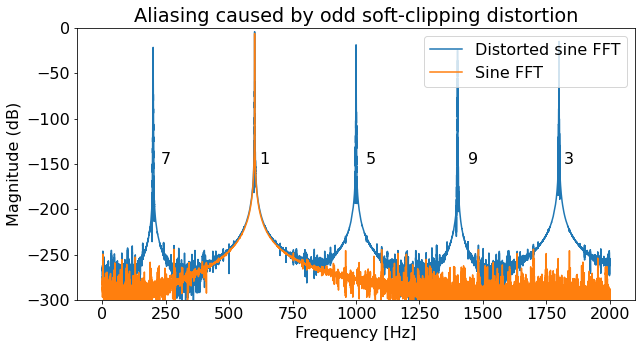

In [37]:
fig, ax = plt.subplots(figsize=figsize)

ax.magnitude_spectrum(sine_disto, Fs=fs_4000, scale="dB", label="Distorted sine FFT")
ax.magnitude_spectrum(sine, Fs=fs_4000, scale="dB", label="Sine FFT")

ax.annotate('1', xy=(620, -150) )
ax.annotate('3', xy=(1820, -150) )
ax.annotate('5', xy=(1040, -150) )
ax.annotate('7', xy=(230, -150) )
ax.annotate('9', xy=(1440, -150) )
plt.title("Aliasing caused by odd soft-clipping distortion")
plt.legend(loc="upper right")
plt.xlabel("Frequency [Hz]")
plt.ylim(-300, 0)
#plt.savefig("odd_disto.pdf", bbox_inches='tight')
plt.show()

### 2.2. The solution: oversampling

Adding a low-pass filter after the non-linear function is useless as the exceding harmonics have already been mirrored back into the frequency spectrum. It is hence necessary to act directly during the nonlinear process. This is done by **oversampling** the signal before applying the nonlinearity, and by **undersampling** it after. By doing so, we increase the Nyquist frequency and hence have a lot more space "on the right" of the frequency plot for the harmonics to spead before they are bounced back to the left. When undersmapling, we reduce the Nyquist frequency back to its original value, and simply discard everything that is greater than it. Hence, most of the harmonics simply disappear and no more (noticeable) aliasing occurs!

Note that technically, it is impossible to completely get rid of aliasing since the harmonics spread up to infinity, however as their intensity quickly decreases, they become unnoticeable even with a relatively small oversampling factor. 

In [16]:
sine_oversample = oversample(sine)
sine_disto_oversample = softClipping(sine_oversample, 50)
sine_disto_downsample = undersample(sine_disto_oversample)

Audio(sine_disto_downsample, rate=fs_4000)

We can observe the influence of changing the oversampling rate on the final signal! The smaller the oversampling rate, the more wrap-up occurs, hence the stronger the aliasing!

In [29]:
@widgets.interact(oversampling=(1, 50, 1))
def update(oversampling=1):
    
    sine_oversample = oversample(sine, oversampling)
    sine_disto_oversample = softClipping(sine_oversample, 100)
    sine_disto_downsample = undersample(sine_disto_oversample, oversampling)

    fig, ax = plt.subplots(4, figsize=(10, 12))

    ax[0].set_title("Sine FFT")
    ax[0].magnitude_spectrum(sine, Fs=fs_4000, scale="dB")
    ax[1].set_title(f"{oversampling}-times oversampled sine FFT")
    ax[1].magnitude_spectrum(sine_oversample, Fs=oversampling*fs_4000, scale="dB")
    ax[2].set_title(f"{oversampling}-times distorted oversampled sine FFT")
    ax[2].magnitude_spectrum(sine_disto_oversample, Fs=oversampling*fs_4000, scale="dB")
    ax[3].set_title("Distorted sine FFT")
    ax[3].magnitude_spectrum(sine_disto_downsample, Fs=fs_4000, scale="dB")

    for axi in ax:
        axi.axvline(fs_4000/2, color="red", label="Nyquist")
        axi.set_ylim(-150, 0)
    
    plt.subplots_adjust(hspace=0.7)
    plt.legend(loc="best")
    #plt.savefig("oversample.pdf", bbox_inches='tight')
    plt.show()

interactive(children=(IntSlider(value=1, description='oversampling', max=50, min=1), Output()), _dom_classes=(…

From now on, we are going to set the default oversampling factor to be 8.

### 2.3. Testing with a guitar sample 

Let's finally try out our waveshaper on a guitar sample.

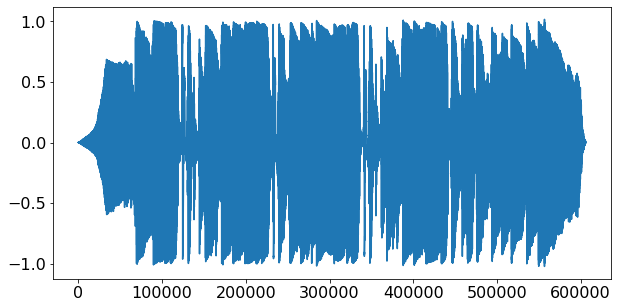

In [19]:
guitar_softclip = oversample(guitar_sample)
guitar_softclip = softClipping(guitar_softclip, 20)
guitar_softclip = undersample(guitar_softclip)

plt.figure(figsize=figsize)
plt.plot(guitar_softclip)

Audio(guitar_softclip, rate=fs)

Still not so good, is it? Although the harmonics have been fixed, the sound is still quite harsh.

### 2.4. Even harmonics

All the clipping functions we have described above are odd functions, i.e. they have a inverse symmetry between the positive and the negative side. This has for consequence to produce only odd harmonics when distorting the signal. Conversely, using an even function (symmetrical with respect to the x axis) as a distortion funtion will generate even harmonics only. Since the original signal is itself an odd harmonic (number 1), we have to add the original signal back to the distorted signal in order no to loose the base frequency. Let's implement one and compare the sound it produces with the odd harmonics distortion sound.

In [20]:
def evenClipping(x, alpha):
    """
    Even hamonics soft-clipping distrotion built as an absolute value of the odd arctan soft-clipping.
    x: the input signal
    alpha: the quantity of distortion
    return: an even distorted signal
    """
    return (x # Original signal
            + np.where(x>0, softClipping(x, 1/alpha), -softClipping(x, 1/alpha)) # Even harmonics
            -1) # Normalize in [-1, 1]

In [21]:
@widgets.interact(alpha=(.1, 2, .1))
def update(alpha=5):
    
    fig, ax = plt.subplots(figsize=figsize)
    ax.plot( np.linspace(-1, 1, 100), evenClipping(np.linspace(-1, 1, 100), alpha) )
    plt.title("Soft-clipping even distortion waveshaper")
    plt.xlabel("Input")
    plt.ylabel("Output")
    ax.set_xlim([-1, 1])
    #ax.set_ylim([-1, 1])
    ax.grid(True)
    plt.show()

interactive(children=(FloatSlider(value=2.0, description='alpha', max=2.0, min=0.1), Output()), _dom_classes=(…

Let's compute the even harmonics of the same example signal shown above, a 600Hz sine.

**Hamonic number** | **Analog frequency** | **Frequency after wrapup**
--- | --- | ---
1 | 600Hz | 600Hz
2 | 1200Hz | 1200Hz
4 | 2400Hz | 1600Hz
6 | 3600Hz | 400Hz
8 | 4800Hz | 800Hz
10| 6000Hz | 2000Hz

In [44]:
sine_disto = evenClipping(sine, 10)
Audio(sine_disto, rate=fs_4000)

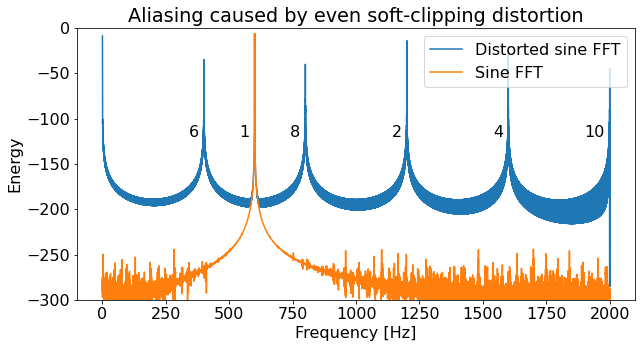

In [47]:
fig, ax = plt.subplots(figsize=figsize)
ax.magnitude_spectrum(sine_disto, Fs=fs_4000, scale="dB", label="Distorted sine FFT")
ax.magnitude_spectrum(sine, Fs=fs_4000, scale="dB", label="Sine FFT")

ax.annotate('1', xy=(540, -120) )
ax.annotate('2', xy=(1140, -120) )
ax.annotate('4', xy=(1540, -120) )
ax.annotate('6', xy=(340, -120) )
ax.annotate('8', xy=(740, -120) )
ax.annotate('10', xy=(1900, -120) )

plt.ylim(-300, 0)
plt.title("Aliasing caused by even soft-clipping distortion")
plt.xlabel("Frequency [Hz]")
plt.ylabel("Energy")
plt.legend(loc="upper right")
#plt.savefig("even_disto.pdf", bbox_inches='tight')
plt.show()

Let us finally listen to this even distortion on the guitar sample (with oversampling of course!). It sounds still harsh, but a little less crunchy than the odd distortion. In the audio production world, even distortion has a reputation of being more mellow and round.

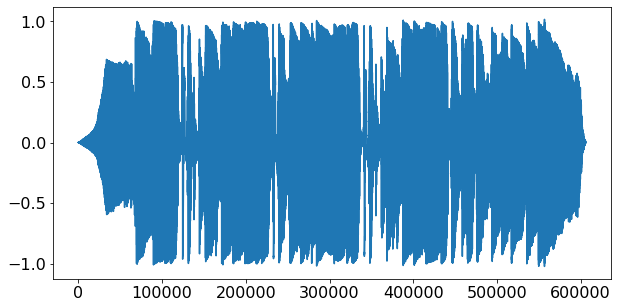

In [24]:
guitar_evenclip = oversample(guitar_sample)
guitar_evenclip = evenClipping(guitar_evenclip, 1)
guitar_evenclip = undersample(guitar_evenclip)

plt.figure(figsize=figsize)
plt.plot(guitar_softclip)

Audio(guitar_evenclip, rate=fs)

## 3. Wiener-Hammerstein model

One of the main issues with the static waveshaper is that it is static, i.e. it does not have memory and can't capture dynamics of a system over time. A lot of music devices, such as distortion or amplifiers, are known to have a dynamic behaviour and hence cannot be properly modelled with a static nonlinearity.

One proposed solution to this is the Wiener-Hammerstein model (a combination of the Wiener model and the Hammerstein model). Both models are gray-box and make the assumption that it is possible to approximate a **nonlinear dynamic system** by chaining several blocks in series, that process the dynamic behaviour and the nonlinearity indepedently. The Wiener-Hammerstein model is hence composed of a LTI filter moddeling a first linear dynamic behaviour, followed by a static nonlinearity, again followed by a second LTI filter.

<img src="https://i.imgur.com/ZLMBJrA.png" alt="Drawing" style="width: 70%;"/>

In the case of a guitar amplifier, the first LTI system can be seen as a modelling of a pre-amplifier, the nonlinearity as the overdrive of the amplifier, and the second LTI system as the cabinet (the speaker). The advantage of this technique is that it is a lot simpler to create and identify LTI models than nonlinear models (a simple impulse response is enough!). One can hence record the impulse response of a speaker, and of a pre-amplifier, and convolve them with a guitar sound for the LTI systems, while using a static waveshaper for the middle nonlinearity. Let's implement this!

In [25]:
def wiener_hammerstein(x, alpha, IR_preamp, IR_cab):
    """
    Wiener-Hammerstein model for dynamic nonlinear systems.
    x: the input signal
    alpha: the intensity of the nonlinearity
    IR_preamp: the impulse response of the first LTI system
    IR_cab: the impulse response of the second LTI system
    return: the filtered normalized signal
    """
    # 1) LTI pre-amp IR
    x = np.convolve(x, IR_preamp)
    
    # 2) Static soft-clipping waveshaper
    x = oversample(x)
    x = softClipping(x, alpha)
    x = undersample(x)
    
    # 3) LTI cabinet IR
    x = np.convolve(x, IR_cab)
    
    return normalize(x) # Normalize

For the impulse responses, it is possible to find online datasets of many guitar amplifiers and cabinets IRs for free. For instance, [the website Overdriven.fr](https://overdriven.fr/overdriven/index.php/irdownloads/#Free_Guitar_Cabinet_Impulse_Responses) provides many free IRs corresponding to different amplifiers. Let's import an IR for the pre-amplifier and for the cabinet, and have a look at their shape and lenght. Both IRs have a duration of 50ms, which is enough for modelling an amplifier's behaviour.

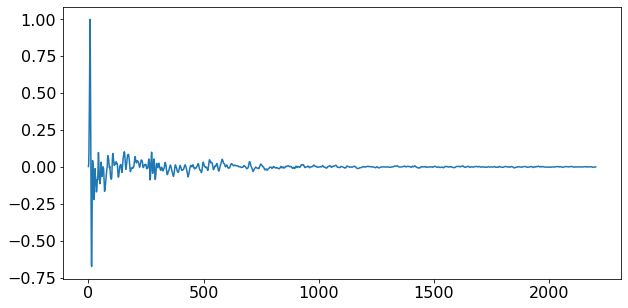

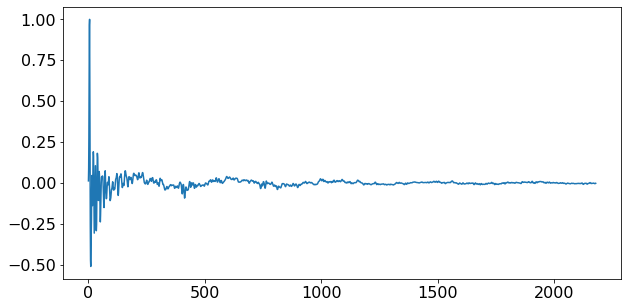

In [26]:
IR_preamp = open_audio("samples/IR_preamp.wav")
IR_cab = open_audio("samples/IR_cab.wav")

Let's now test our model using the same guitar sample as before. It sounds much better!

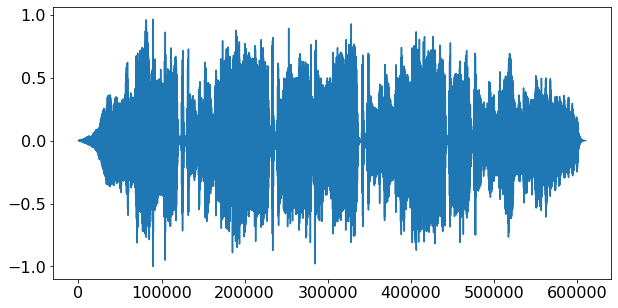

In [27]:
guitar_wh = wiener_hammerstein(guitar_sample, 8, IR_preamp, IR_cab)
    
plt.figure(figsize=figsize)
plt.plot(guitar_wh)
Audio(guitar_wh, rate=fs)